# Modeling
The codes in this notebook will contain all the models used to classify households and the final hyptertuned model. The metric used for all the models will be the precision as we also want to challenge the poverty threshold through the use of the False Positives. The False Positives simply indicate that the model predicted them to be below the poverty line but in reality they are not, which suggests that these households are poverty-like or shows properties that made the model consider them to be below the poverty line.

## Miscellaneous

In [2]:
import pandas as pd
import numpy as np
import time
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

# visualization
from sklearn.tree import export_graphviz
from sklearn.metrics import ConfusionMatrixDisplay

# modeling
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV, cross_validate
from sklearn.tree import DecisionTreeClassifier, ExtraTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

# evaluation metric
from sklearn.metrics import (accuracy_score, precision_score,
                             recall_score, f1_score, classification_report)

# interpretability
import shap

# pipeline
from imblearn.pipeline import Pipeline, make_pipeline

# imbalanced techniques
from imblearn.over_sampling import (SMOTE, ADASYN, BorderlineSMOTE, SVMSMOTE)
from imblearn.under_sampling import (TomekLinks, NearMiss, AllKNN,
                                     EditedNearestNeighbours,
                                     RepeatedEditedNearestNeighbours)
from imblearn.combine import SMOTETomek, SMOTEENN

# feature selection
from sklearn.feature_selection import RFE, RFECV

# export model
import pickle

## Preliminaries

In [4]:
df = pd.read_csv('data/final_fies_data.csv')
df.drop(columns=['SEQUENCE_NO'], axis=1, inplace=True)
df

,SEASON_SAL,WAGES,NETSHARE,CASH_ABROAD,CASH_DOMESTIC,RENTALS_REC,INTEREST,PENSION,DIVIDENDS,OTHER_SOURCE,...,region_Region IVB - MIMAROPA,region_Region IX - Zamboanga Peninsula,region_Region V- Bicol,region_Region VI - Western Visayas,region_Region VII - Central Visayas,region_Region VIII - Eastern Visayas,region_Region X - Northern Mindanao,region_Region XI - Davao,region_Region XII - SOCCSKSARGEN,region_Region XIII - Caraga
0,0,290000,0,0,340000,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,72000,152000,20500,60000,32500,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,30000,81000,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,8700,170000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,80400,92400,250,30000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
165024,0,0,0,26000,4200,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
165025,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
165026,54900,109950,0,0,15500,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
165027,3600,3600,0,5000,37800,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0


In [5]:
# Splitting
feature = "IS_POVERTY"
state = 1337
size = 0.25

X = df.drop([feature], axis=1)
y = df[feature]

(X_trainval, X_holdout, y_trainval, y_holdout) = train_test_split(X, y, test_size=size,
                                                                  random_state=state,
                                                                  stratify=y)

## Modeling

The following models will be trained and tested to see which baseline model gives the highest precision:
- Logistic Regression
- Random Forest
- KNeighborsClassifier
- Gradient Boosting
- XGBoost
- LGBM
- ExtraTreeClassifier
- DecisionTreeClassifier

#### Modeling Pipeline for Baseline Evaluation

In [4]:
def auto_ml(X, y, models_dict, scaler=None, cv=None, res_t=None):
    results = {}

    # log start time
    total_start_time = time.time()

    for model_name, model in tqdm(models_dict.items()):
        print(f"Currently Training: {model_name}")

        # metrics list
        train_scores = []
        val_scores = []
        train_recall = []
        val_recall = []
        train_precision = []
        val_precision = []
        train_f1 = []
        val_f1 = []

        # runtimes
        runtimes = []

        for train_index, val_index in tqdm(cv.split(X, y)):
            X_train, X_val = X.iloc[train_index], X.iloc[val_index]
            y_train, y_val = y.iloc[train_index], y.iloc[val_index]

            # Apply scaling
            if scaler is not None:
                X_train = scaler.fit_transform(X_train)
                X_val = scaler.transform(X_val)
            
            # Apply resampling
            if res_t is not None:
                s = time.time()
                X_train, y_train = res_f.fit_resample(X_train, y_train)
                print(f"Resampling done in {time.time() - s}")
            
            start_time = time.time()

            # fit
            model.fit(X_train, y_train)

            # predict
            train_preds = model.predict(X_train)
            val_preds = model.predict(X_val)

            # get accuracy score
            train_scores.append(model.score(X_train, y_train))
            val_scores.append(model.score(X_val, y_val))

            # get recall score
            train_recall.append(recall_score(y_train, train_preds))
            val_recall.append(recall_score(y_val, val_preds))

            # get precision score
            train_precision.append(precision_score(y_train, train_preds))
            val_precision.append(precision_score(y_val, val_preds))

            # get f1 score
            train_f1.append(f1_score(y_train, train_preds))
            val_f1.append(f1_score(y_val, val_preds))

            # get run time
            end_time = time.time()
            runtimes.append(end_time - start_time)

        results[model_name] = {
            'Train Accuracy': np.round(np.mean(train_scores) * 100, 2),
            'Val Accuracy': np.round(np.mean(val_scores)*100, 2),
            'Train Recall': np.round(np.mean(train_recall)*100, 2),
            'Val Recall': np.round(np.mean(val_recall)*100, 2),
            'Train Precision': np.round(np.mean(train_precision)*100, 2),
            'Val Precision': np.round(np.mean(val_precision)*100, 2),
            'Train F1 Score': np.round(np.mean(train_f1)*100, 2),
            'Val F1 Score': np.round(np.mean(val_f1)*100, 2),
            'Run Time': np.round(np.mean(runtimes), 2)
        }

    total_time = time.time() - total_start_time
    print(f"[DONE] Completed after {total_time}")
    
    results = pd.DataFrame(results).T
    return results

### Baseline

In [9]:
n_jobs = -1
models_dict = {"LogisticRegression": LogisticRegression(random_state=state, n_jobs=n_jobs),
               "RandomForestClassifier": RandomForestClassifier(random_state=state, n_jobs=n_jobs),
               "KNeighborsClassifier": KNeighborsClassifier(n_jobs=n_jobs),
               "GradientBoostingClassifier": GradientBoostingClassifier(random_state=state),
               "XGBClassifier": XGBClassifier(objective='binary:logistic'),
               "LGBMClassifier": LGBMClassifier(random_state=state, n_jobs=n_jobs),
               "ExtraTreeClassifier": ExtraTreeClassifier(random_state=state),
               "DecisionTreeClassifier": DecisionTreeClassifier(random_state=state)}

Without Scaling

In [7]:
auto_run_no_scale = auto_ml(X_trainval, y_trainval, models_dict,
                    cv=StratifiedKFold(n_splits=5))
auto_run_no_scale

  0%|          | 0/8 [00:00<?, ?it/s]

Currently Training: LogisticRegression


5it [00:25,  5.10s/it]
 12%|█▎        | 1/8 [00:25<02:58, 25.50s/it]

Currently Training: RandomForestClassifier


5it [00:37,  7.43s/it]
 25%|██▌       | 2/8 [01:02<03:14, 32.36s/it]

Currently Training: KNeighborsClassifier


5it [1:45:43, 1268.78s/it]
 38%|███▊      | 3/8 [1:46:46<4:02:51, 2914.34s/it]

Currently Training: GradientBoostingClassifier


5it [14:12, 170.57s/it]
 50%|█████     | 4/8 [2:00:59<2:20:01, 2100.50s/it]

Currently Training: XGBClassifier


5it [00:11,  2.36s/it]
 62%|██████▎   | 5/8 [2:01:11<1:07:21, 1347.31s/it]

Currently Training: LGBMClassifier


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 15484, number of negative: 83532
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014564 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 14806
[LightGBM] [Info] Number of data points in the train set: 99016, number of used features: 79
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.156379 -> initscore=-1.685423
[LightGBM] [Info] Start training from score -1.685423


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 15484, number of negative: 83533
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.046781 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14794
[LightGBM] [Info] Number of data points in the train set: 99017, number of used features: 79
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.156377 -> initscore=-1.685435
[LightGBM] [Info] Start training from score -1.685435


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 15484, number of negative: 83533
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.058028 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14802
[LightGBM] [Info] Number of data points in the train set: 99017, number of used features: 79
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.156377 -> initscore=-1.685435
[LightGBM] [Info] Start training from score -1.685435


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 15484, number of negative: 83533
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.059310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14807
[LightGBM] [Info] Number of data points in the train set: 99017, number of used features: 79
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.156377 -> initscore=-1.685435
[LightGBM] [Info] Start training from score -1.685435


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 15484, number of negative: 83533
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.076175 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14768
[LightGBM] [Info] Number of data points in the train set: 99017, number of used features: 79
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.156377 -> initscore=-1.685435
[LightGBM] [Info] Start training from score -1.685435


5it [00:09,  1.96s/it]
 75%|███████▌  | 6/8 [2:01:21<29:45, 892.56s/it]   

Currently Training: ExtraTreeClassifier


5it [00:03,  1.45it/s]
 88%|████████▊ | 7/8 [2:01:24<10:01, 601.89s/it]

Currently Training: DecisionTreeClassifier


5it [00:48,  9.79s/it]
100%|██████████| 8/8 [2:02:13<00:00, 916.69s/it]

[DONE] Completed after 7333.531865119934


,Train Accuracy,Val Accuracy,Train Recall,Val Recall,Train Precision,Val Precision,Train F1 Score,Val F1 Score,Run Time
LogisticRegression,88.62,88.58,44.47,44.33,72.09,71.87,55.01,54.83,5.04
RandomForestClassifier,100.00,87.94,99.99,33.79,100.00,75.58,100.00,46.69,7.38
KNeighborsClassifier,90.77,86.53,65.73,53.77,72.64,57.42,69.01,55.53,1268.72
GradientBoostingClassifier,88.61,88.22,43.23,41.76,72.89,70.99,54.27,52.57,170.51
XGBClassifier,93.24,89.44,71.21,56.10,83.12,70.37,76.71,62.42,2.31
LGBMClassifier,90.95,89.54,59.03,53.80,77.77,72.21,67.11,61.65,1.91
ExtraTreeClassifier,100.00,80.53,100.00,41.02,100.00,38.49,100.00,39.71,0.64
DecisionTreeClassifier,100.00,82.56,100.00,46.73,100.00,44.52,100.00,45.59,9.75


With Scaling

In [21]:
auto_run = auto_ml(X_trainval, y_trainval, models_dict,
                scaler=StandardScaler(), cv=StratifiedKFold(n_splits=5))
auto_run

  0%|          | 0/8 [00:00<?, ?it/s]

Currently Training: LogisticRegression


5it [00:10,  2.13s/it]
 12%|█▎        | 1/8 [00:10<01:14, 10.67s/it]

Currently Training: RandomForestClassifier


5it [00:24,  4.82s/it]
 25%|██▌       | 2/8 [00:34<01:51, 18.57s/it]

Currently Training: KNeighborsClassifier


5it [02:40, 32.03s/it]
 38%|███▊      | 3/8 [03:14<06:56, 83.23s/it]

Currently Training: GradientBoostingClassifier


5it [05:51, 70.32s/it]
 50%|█████     | 4/8 [09:06<12:36, 189.17s/it]

Currently Training: XGBClassifier


5it [00:05,  1.07s/it]
 62%|██████▎   | 5/8 [09:11<06:08, 122.90s/it]

Currently Training: LGBMClassifier


[LightGBM] [Info] Number of positive: 15484, number of negative: 83532
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.044226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14858
[LightGBM] [Info] Number of data points in the train set: 99016, number of used features: 79
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.156379 -> initscore=-1.685423
[LightGBM] [Info] Start training from score -1.685423


[LightGBM] [Info] Number of positive: 15484, number of negative: 83533
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.036885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14842
[LightGBM] [Info] Number of data points in the train set: 99017, number of used features: 79
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.156377 -> initscore=-1.685435
[LightGBM] [Info] Start training from score -1.685435


[LightGBM] [Info] Number of positive: 15484, number of negative: 83533
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.037517 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14852
[LightGBM] [Info] Number of data points in the train set: 99017, number of used features: 79
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.156377 -> initscore=-1.685435
[LightGBM] [Info] Start training from score -1.685435


[LightGBM] [Info] Number of positive: 15484, number of negative: 83533
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.035602 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14878
[LightGBM] [Info] Number of data points in the train set: 99017, number of used features: 79
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.156377 -> initscore=-1.685435
[LightGBM] [Info] Start training from score -1.685435


[LightGBM] [Info] Number of positive: 15484, number of negative: 83533
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.045139 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14819
[LightGBM] [Info] Number of data points in the train set: 99017, number of used features: 79
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.156377 -> initscore=-1.685435
[LightGBM] [Info] Start training from score -1.685435


5it [00:06,  1.33s/it]
 75%|███████▌  | 6/8 [09:18<02:46, 83.37s/it] 

Currently Training: ExtraTreeClassifier


5it [00:02,  1.99it/s]
 88%|████████▊ | 7/8 [09:21<00:56, 56.94s/it]

Currently Training: DecisionTreeClassifier


5it [00:21,  4.24s/it]
100%|██████████| 8/8 [09:42<00:00, 72.78s/it]

[DONE] Completed after 582.2743837833405


,Train Accuracy,Val Accuracy,Train Recall,Val Recall,Train Precision,Val Precision,Train F1 Score,Val F1 Score,Run Time
LogisticRegression,88.96,88.94,52.22,52.26,69.58,69.44,59.66,59.63,1.98
RandomForestClassifier,100.00,87.93,99.99,33.71,100.00,75.59,100.00,46.62,4.68
KNeighborsClassifier,89.50,84.17,64.06,50.62,67.24,49.40,65.61,50.00,31.89
GradientBoostingClassifier,88.61,88.22,43.23,41.76,72.89,70.99,54.27,52.57,70.17
XGBClassifier,93.24,89.44,71.21,56.10,83.12,70.37,76.71,62.42,0.92
LGBMClassifier,90.92,89.46,58.85,53.47,77.71,71.95,66.98,61.34,1.16
ExtraTreeClassifier,100.00,80.49,100.00,40.86,100.00,38.37,100.00,39.58,0.35
DecisionTreeClassifier,100.00,82.57,100.00,46.73,100.00,44.53,100.00,45.60,4.09


### Grid-Search and Randomized Search Cross Validation

From the baseline models, we will be hypertuning the following models:
- RandomForestClassifier
- XGBoost
- LGBM


These models will be hypertuned as they got good precision scores. Although Random Forest got the highest precision score, the other metrics were low as it tends to potentially overfit. Thus, Random Forest will be hypertuned alongside the other models. LGBM will be hypertuned as it got the next highest precision score and has a decent f1 score. Lastly, XGBoost will also be hypertuned since overall, all of its metrics are decent or relatively high.

In [9]:
auto_run_no_scale

,Train Accuracy,Val Accuracy,Train Recall,Val Recall,Train Precision,Val Precision,Train F1 Score,Val F1 Score,Run Time
LogisticRegression,88.62,88.58,44.47,44.33,72.09,71.87,55.01,54.83,5.04
RandomForestClassifier,100.00,87.94,99.99,33.79,100.00,75.58,100.00,46.69,7.38
KNeighborsClassifier,90.77,86.53,65.73,53.77,72.64,57.42,69.01,55.53,1268.72
GradientBoostingClassifier,88.61,88.22,43.23,41.76,72.89,70.99,54.27,52.57,170.51
XGBClassifier,93.24,89.44,71.21,56.10,83.12,70.37,76.71,62.42,2.31
LGBMClassifier,90.95,89.54,59.03,53.80,77.77,72.21,67.11,61.65,1.91
ExtraTreeClassifier,100.00,80.53,100.00,41.02,100.00,38.49,100.00,39.71,0.64
DecisionTreeClassifier,100.00,82.56,100.00,46.73,100.00,44.52,100.00,45.59,9.75


#### Hypertuning Functions
Creating functions to hypertune each model

In [27]:
# Function to train and hypertune Random Forest Classifier
def train_rf(X, y, metric, res_t=None, hypertune=False, resample=False):
    params = {
        'n_estimators': [50, 100, 200],
        'max_depth': [8, 10, 20, None],
        'max_features': ['sqrt', 'log2', None],
        'min_samples_split': [1, 2, 3]
    }

    new_params = {'randomforestclassifier__' + 
                  key: params[key] for key in params}

    skf = StratifiedKFold(n_splits=5)


    if resample:
        imba_pipeline = make_pipeline(res_t,
                                      RandomForestClassifier(random_state=state, n_jobs=n_jobs))
    else:
        imba_pipeline = make_pipeline(RandomForestClassifier(random_state=state, n_jobs=n_jobs))

    if hypertune:
        clf = GridSearchCV(imba_pipeline, param_grid=new_params,
                           cv=skf, scoring=metric, return_train_score=True,
                           verbose=10)
        start_time = time.time()
        clf.fit(X,y)
        run_time = time.time() - start_time
        model = clf.best_estimator_.fit(X,y)
        return ['Random Forest Classifier', np.mean(clf.cv_results_['mean_train_score']),
                clf.best_score_, 'Best parameters = {0}'.format(clf.best_params_),
                run_time, model]
    else:
        clf = imba_pipeline
        start_time = time.time()
        clf.fit(X,y)
        run_time = time.time() - start_time
        cv_scores = cross_validate(estimator=clf, X=X, y=y,
                                   scoring=metric, cv=skf, n_jobs=-1,
                                   return_train_score=True)
        
        return ['Random Forest Classifier', np.mean(cv_scores['train_score']), np.mean(cv_scores['test_score']),
                run_time, clf]

# Function to train and hypertune XGBoost
def train_xgb(X, y, metric, res_t=None, hypertune=False, resample=False):
    params = {
        'eta': [1, 0.5, 0.3, 0.1, 0.01],
        'max_depth': [1, 3, 5, 6, 8, 10],
        'min_child_weight': [1, 2, 3],
        'gamma': [0, 0.1, 0.2],
        'max_delta_step': [0, 0.5, 1],
        "n_estimators": [1, 10, 50, 100, 200],
    }

    new_params = {'xgbclassifier__' + 
                  key: params[key] for key in params}

    skf = StratifiedKFold(n_splits=5)

    if resample:
        imba_pipeline = make_pipeline(res_t,
                                      XGBClassifier(objective='binary:logistic'))
    else:
        imba_pipeline = make_pipeline(XGBClassifier(objective='binary:logistic'))

    if hypertune:
        clf = GridSearchCV(imba_pipeline, param_grid=new_params, cv=skf,
                           scoring=metric, return_train_score=True, verbose=10)
        start_time = time.time()
        clf.fit(X,y)
        run_time = time.time() - start_time
        model = clf.best_estimator_.fit(X,y)

        return ['XGBoosting Classifier', np.mean(clf.cv_results_['mean_train_score']),
                clf.best_score_, 'Best parameters = {0}'.format(clf.best_params_),
                run_time, model]
    else:
        clf = imba_pipeline
        start_time = time.time()
        clf.fit(X,y)
        run_time = time.time() - start_time
        cv_scores = cross_validate(estimator=clf, X=X, y=y,
                                   scoring=metric, cv=skf, n_jobs=-1,
                                   return_train_score=True)
        
        return ['XGBoosting Classifier', np.mean(cv_scores['train_score']),
                np.mean(cv_scores['test_score']), run_time, clf]

# Function to train and hypertune Light GBM
def train_lgbm(X, y, metric, res_t=None, hypertune=False, resample=False):
    params = {
        "n_estimators": [1, 10, 50, 100, 200],
        "learning_rate": [1, 0.75, 0.5, 0.1, 0.01]
    }

    new_params = {'lgbmclassifier__' + 
                  key: params[key] for key in params}

    skf = StratifiedKFold(n_splits=5)

    if resample:
        imba_pipeline = make_pipeline(res_t,
                                      LGBMClassifier(random_state=state, n_jobs=-1))
    else:
        imba_pipeline = make_pipeline(LGBMClassifier(random_state=state, n_jobs=-1))

    if hypertune:
        clf = GridSearchCV(imba_pipeline, param_grid=new_params, cv=skf,
                           scoring=metric, return_train_score=True, verbose=10)
        start_time = time.time()
        clf.fit(X,y)
        run_time = time.time() - start_time
        model = clf.best_estimator_.fit(X,y)

        return ['LGBM Classifier', np.mean(clf.cv_results_['mean_train_score']),
                clf.best_score_, 'Best parameters = {0}'.format(clf.best_params_),
                run_time, model]
    else:
        clf = imba_pipeline
        start_time = time.time()
        clf.fit(X,y)
        run_time = time.time() - start_time
        cv_scores = cross_validate(estimator=clf, X=X, y=y,
                                   scoring=metric, cv=skf, n_jobs=-1,
                                   return_train_score=True)
        
        return ['LGBM Classifier', np.mean(cv_scores['train_score']),
                np.mean(cv_scores['test_score']), run_time, clf]

#### Hypertuning Random Forest

In [21]:
rf_hypertuned = train_rf(X_trainval, y_trainval, 'precision', res_t=None, hypertune=True, resample=False)
rf_hypertuned

Fitting 5 folds for each of 108 candidates, totalling 540 fits
[CV 1/5; 1/108] START randomforestclassifier__max_depth=8, randomforestclassifier__max_features=sqrt, randomforestclassifier__min_samples_split=1, randomforestclassifier__n_estimators=50
[CV 1/5; 1/108] END randomforestclassifier__max_depth=8, randomforestclassifier__max_features=sqrt, randomforestclassifier__min_samples_split=1, randomforestclassifier__n_estimators=50;, score=(train=nan, test=nan) total time=   0.0s
[CV 2/5; 1/108] START randomforestclassifier__max_depth=8, randomforestclassifier__max_features=sqrt, randomforestclassifier__min_samples_split=1, randomforestclassifier__n_estimators=50
[CV 2/5; 1/108] END randomforestclassifier__max_depth=8, randomforestclassifier__max_features=sqrt, randomforestclassifier__min_samples_split=1, randomforestclassifier__n_estimators=50;, score=(train=nan, test=nan) total time=   0.0s
[CV 3/5; 1/108] START randomforestclassifier__max_depth=8, randomforestclassifier__max_features

['Random Forest Classifier',
 np.float64(nan),
 np.float64(0.8969868871950663),
 "Best parameters = {'randomforestclassifier__max_depth': 8, 'randomforestclassifier__max_features': 'log2', 'randomforestclassifier__min_samples_split': 2, 'randomforestclassifier__n_estimators': 200}",
 4925.176108121872,
 Pipeline(steps=[('randomforestclassifier',
                  RandomForestClassifier(max_depth=8, max_features='log2',
                                         n_estimators=200, n_jobs=-1,
                                         random_state=1337))])]

#### Hypertuning XG Boost

In [6]:
xgb_hypertuned = train_xgb(X_trainval, y_trainval, 'precision', res_t=None, hypertune=True, resample=False)
xgb_hypertuned

Fitting 5 folds for each of 4050 candidates, totalling 20250 fits
[CV 1/5; 1/4050] START xgbclassifier__eta=1, xgbclassifier__gamma=0, xgbclassifier__max_delta_step=0, xgbclassifier__max_depth=1, xgbclassifier__min_child_weight=1, xgbclassifier__n_estimators=1
[CV 1/5; 1/4050] END xgbclassifier__eta=1, xgbclassifier__gamma=0, xgbclassifier__max_delta_step=0, xgbclassifier__max_depth=1, xgbclassifier__min_child_weight=1, xgbclassifier__n_estimators=1;, score=(train=0.000, test=0.000) total time=   0.4s
[CV 2/5; 1/4050] START xgbclassifier__eta=1, xgbclassifier__gamma=0, xgbclassifier__max_delta_step=0, xgbclassifier__max_depth=1, xgbclassifier__min_child_weight=1, xgbclassifier__n_estimators=1
[CV 2/5; 1/4050] END xgbclassifier__eta=1, xgbclassifier__gamma=0, xgbclassifier__max_delta_step=0, xgbclassifier__max_depth=1, xgbclassifier__min_child_weight=1, xgbclassifier__n_estimators=1;, score=(train=0.000, test=0.000) total time=   0.2s
[CV 3/5; 1/4050] START xgbclassifier__eta=1, xgbclas

['XGBoosting Classifier',
 np.float64(0.49728428850867984),
 np.float64(0.8817788860928806),
 "Best parameters = {'xgbclassifier__eta': 0.01, 'xgbclassifier__gamma': 0, 'xgbclassifier__max_delta_step': 0, 'xgbclassifier__max_depth': 8, 'xgbclassifier__min_child_weight': 2, 'xgbclassifier__n_estimators': 100}",
 24953.67608189583,
 Pipeline(steps=[('xgbclassifier',
                  XGBClassifier(base_score=None, booster=None, callbacks=None,
                                colsample_bylevel=None, colsample_bynode=None,
                                colsample_bytree=None, device=None,
                                early_stopping_rounds=None,
                                enable_categorical=False, eta=0.01,
                                eval_metric=None, feature_types=None, gamma=0,
                                grow_policy=None, importance_type=None,
                                interaction_constraints=None, learning_rate=None,
                                max_bin=None, 

#### Hypertuning LGBM

In [11]:
lgbm_hypertuned = train_lgbm(X_trainval, y_trainval, 'precision', res_t=None, hypertune=True, resample=False)
lgbm_hypertuned

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5; 1/25] START lgbmclassifier__learning_rate=1, lgbmclassifier__n_estimators=1
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 15484, number of negative: 83532
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.076399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14806
[LightGBM] [Info] Number of data points in the train set: 99016, number of used features: 79
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.156379 -> initscore=-1.685423
[LightGBM] [Info] Start training from score -1.685423
[CV 1/5; 1/25] END lgbmclassifier__learning_rate=1, lgbmclassifier__n_estimators=1;, score=(train=0.551, test=0.532) total time=   0.7s
[CV 2/5; 1/25] START lgbmclassifier__learning_rate=1, lgbmclassifier__n_estimators=1
[LightGBM] [Warning] Found whitespace in feature_names, r

['LGBM Classifier',
 np.float64(0.6232915827580172),
 np.float64(0.878942222383707),
 "Best parameters = {'lgbmclassifier__learning_rate': 0.01, 'lgbmclassifier__n_estimators': 100}",
 171.09615540504456,
 Pipeline(steps=[('lgbmclassifier',
                  LGBMClassifier(learning_rate=0.01, n_jobs=-1,
                                 random_state=1337))])]

#### Final Parameters

After all the hypertuning of the models, here are the final parameters of each model:
| Model | Parameters|
|---|---|
| Random Forest | `max_depth=8`, `max_features='log2'`, `n_estimators=200` |
| XG Boost | `max_depth=8`, `eta=0.01`, `max_delta_step=0`, `gamma=0`, `min_child_weight=2`, `n_estimators=100` |
| Light Gradient-Boosting Machine | `learning_rate=0.01`, `n_estimators=100` |

In [14]:
rf_params = {'max_depth': 8, 'max_features': 'log2', 'n_estimators': 200}
xgb_params = {'max_depth': 8, 'eta': 0.01, 'max_delta_step': 0, 'gamma': 0, 'min_child_weight': 2, 'n_estimators': 100}
lgbm_params = {'learning_rate': 0.01, 'n_estimators': 100}

#### Comparison of Hypertuned Models
Finally, to see which model is most appropriate to use for the poverty threshold, we will compare each of the hypertuned models to each other. We will also compare it to the baseline model to see how much the hypertuning has improved the model's precision score.

Hypertuned Models

In [25]:
rf_hyper = rf_hypertuned[-1]
xgb_hyper = xgb_hypertuned[-1]
lgbm_hyper = lgbm_hypertuned[-1]

# Re-fitting the model
rf_hyper.fit(X_trainval, y_trainval)
xgb_hyper.fit(X_trainval, y_trainval)
lgbm_hyper.fit(X_trainval, y_trainval)

# Predict using the models
rf_preds = rf_hyper.predict(X_holdout)
xgb_preds = xgb_hyper.predict(X_holdout)
lgbm_preds = lgbm_hyper.predict(X_holdout)

# Getting precision scores
rf_hyper_prec = precision_score(y_holdout, rf_preds)
xgb_hyper_prec = precision_score(y_holdout, xgb_preds)
lgbm_hyper_prec = precision_score(y_holdout, lgbm_preds)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 19355, number of negative: 104416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.060031 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14891
[LightGBM] [Info] Number of data points in the train set: 123771, number of used features: 79
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.156378 -> initscore=-1.685432
[LightGBM] [Info] Start training from score -1.685432


Base Models

In [29]:
rf_base = train_rf(X_trainval, y_trainval, 'precision',  hypertune=False, resample=False)
xgb_base = train_xgb(X_trainval, y_trainval, 'precision',  hypertune=False, resample=False)
lgbm_base = train_lgbm(X_trainval, y_trainval, 'precision',  hypertune=False, resample=False)

# Getting the model only
rf_base_model = rf_base[-1]
xgb_base_model = xgb_base[-1]
lgbm_base_model = lgbm_base[-1]

# Re-fitting the model for the holdout
rf_base_model.fit(X_trainval, y_trainval)
xgb_base_model.fit(X_trainval, y_trainval)
lgbm_base_model.fit(X_trainval, y_trainval)

# Predict using the models
rf_preds = rf_base_model.predict(X_holdout)
xgb_preds = xgb_base_model.predict(X_holdout)
lgbm_preds = lgbm_base_model.predict(X_holdout)

# Getting the precision scores
rf_prec = precision_score(y_holdout, rf_preds)
xgb_prec = precision_score(y_holdout, xgb_preds)
lgbm_prec = precision_score(y_holdout, lgbm_preds)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 19355, number of negative: 104416
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018688 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 14891
[LightGBM] [Info] Number of data points in the train set: 123771, number of used features: 79
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.156378 -> initscore=-1.685432
[LightGBM] [Info] Start training from score -1.685432
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 19355, number of negative: 104416
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017378 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `for

#### Summary Table

In [18]:
print(xgb_hypertuned[1])
print(xgb_hypertuned[2])
print(lgbm_hypertuned[1])
print(lgbm_hypertuned[2])

0.49728428850867984
0.8817788860928806
0.6232915827580172
0.878942222383707


In [34]:
cols = ['Model', 'Train Precision', 'Val Precision', 'Holdout Precision']
summary = pd.DataFrame(columns=cols)

summary.loc[0] = ['Random Forest (Baseline)',
                  '{:.2f}%'.format(np.round(rf_base[1]*100, 2)),
                  '{:.2f}%'.format(np.round(rf_base[2]*100, 2)),
                  '{:.2f}%'.format(np.round(rf_prec*100, 2))]
summary.loc[1] = ['Random Forest (Hypertuned)',
                  '{:.2f}%'.format(np.round(rf_hypertuned[1]*100, 2)),
                  '{:.2f}%'.format(np.round(rf_hypertuned[2]*100, 2)),
                  '{:.2f}%'.format(np.round(rf_hyper_prec*100, 2))]
summary.loc[2] = ['XG Boost (Baseline)',
                  '{:.2f}%'.format(np.round(xgb_base[1]*100, 2)),
                  '{:.2f}%'.format(np.round(xgb_base[2]*100, 2)),
                  '{:.2f}%'.format(np.round(xgb_prec*100, 2))]
summary.loc[3] = ['XG Boost (Hypertuned)',
                  '{:.2f}%'.format(np.round(xgb_hypertuned[1]*100, 2)),
                  '{:.2f}%'.format(np.round(xgb_hypertuned[2]*100, 2)),
                  '{:.2f}%'.format(np.round(xgb_hyper_prec*100, 2))]
summary.loc[4] = ['LGBM (Baseline)',
                  '{:.2f}%'.format(np.round(lgbm_base[1]*100, 2)),
                  '{:.2f}%'.format(np.round(lgbm_base[2]*100, 2)),
                  '{:.2f}%'.format(np.round(lgbm_prec*100, 2))]
summary.loc[5] = ['LGBM (Hypertuned)',
                  '{:.2f}%'.format(np.round(lgbm_hypertuned[1]*100, 2)),
                  '{:.2f}%'.format(np.round(lgbm_hypertuned[2]*100, 2)),
                  '{:.2f}%'.format(np.round(lgbm_hyper_prec*100, 2))]

display(summary)

,Model,Train Precision,Val Precision,Holdout Precision
0,Random Forest (Baseline),100.00%,75.58%,75.63%
1,Random Forest (Hypertuned),nan%,89.70%,86.64%
2,XG Boost (Baseline),83.12%,70.37%,70.00%
3,XG Boost (Hypertuned),49.73%,88.18%,87.54%
4,LGBM (Baseline),77.77%,72.21%,71.71%
5,LGBM (Hypertuned),62.33%,87.89%,88.35%


From the above, we see that the hypertuned LGBM model had the highest precision score at the holdout dataset, which is around 88%.

### Model as Pickle File
Note: will re-train model since SHAP doesn't work on pipelines

In [55]:
lgbm_model = LGBMClassifier(learning_rate=0.01, n_jobs=-1, random_state=1337)
lgbm_model.fit(X_trainval, y_trainval)
pickle.dump(lgbm_model, open("lgbm_model.pkl", 'wb'))

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 19355, number of negative: 104416
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.097101 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14891
[LightGBM] [Info] Number of data points in the train set: 123771, number of used features: 79
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.156378 -> initscore=-1.685432
[LightGBM] [Info] Start training from score -1.685432


### Feature Importance
To determine the exact features that affect whether a hosuehold is above or below the poverty threshold, we examine the feature importance using SHAP

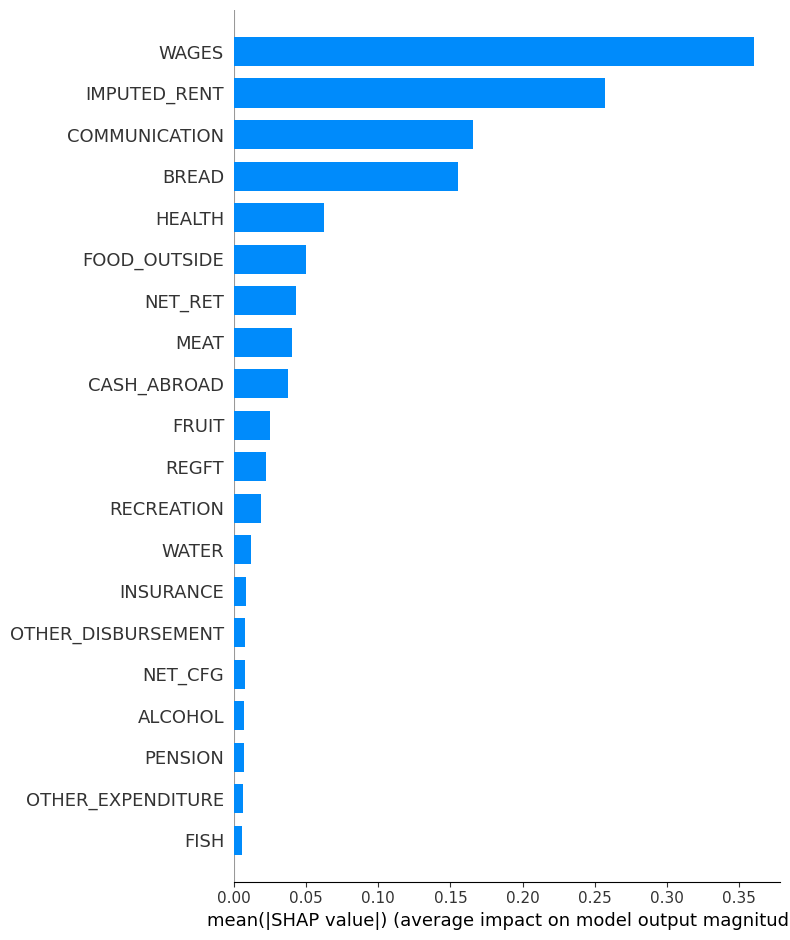

In [6]:
model = pickle.load(open("models/lgbm_model.pkl", 'rb'))
explainer = shap.TreeExplainer(model, feature_names=X_holdout.columns)
shap_values = explainer.shap_values(X_holdout, check_additivity=False)
shap.summary_plot(shap_values, feature_names=X_holdout.columns, plot_type='bar')

The graph above shows the top features that bring a great impact to the classification of the model. We see that the top 5 features are Wages, Imputed Rent, Communication, Bread, and Health. This means that the values in these categories have the most impact in determining whether a household is above or below the poverty.

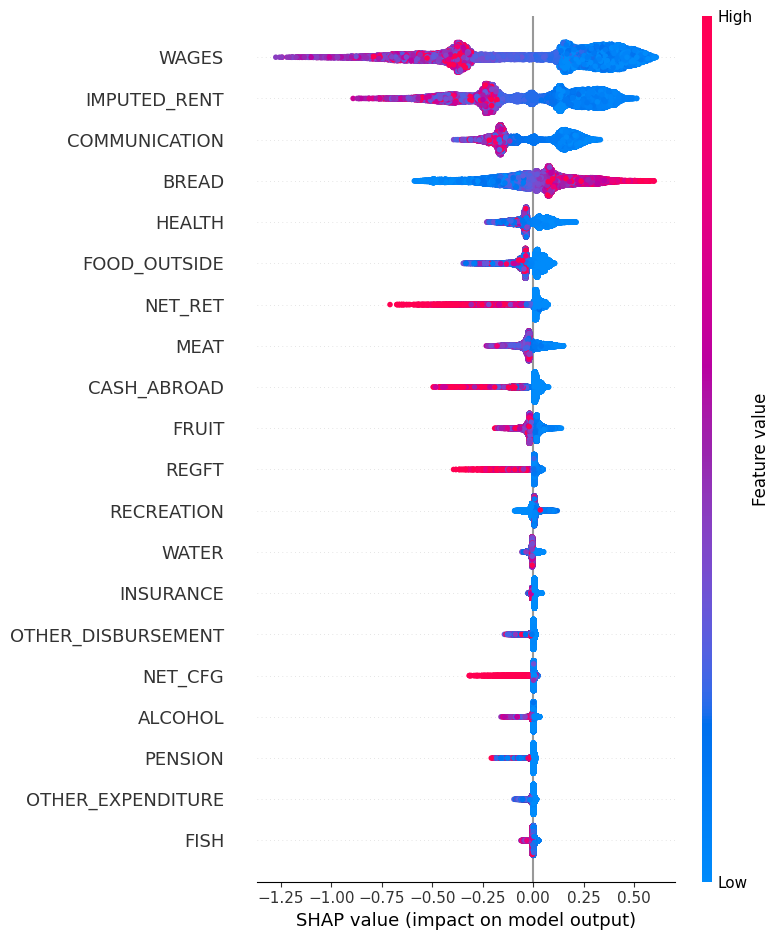

In [58]:
shap.summary_plot(shap_values, X_holdout, feature_names=X_holdout.columns, plot_type='dot')

Looking deeper into the features, we can notice a few things using the Beeswarm plot. First, we can divide the categories into income, expenses, essential, food, and lifestyle.

The categories `wages`, `imputed rent`, `net_ret`, `cash_abroad`, `regft`, `net_cfg`, and `pension` are part of the **income** group. We can notice that the lower the values are for these categories, the more likely the model classifies the household as below the poverty line. In general, this tells us lower wages tend to restrict a household's expenses. Similarly, a household is classified as above the poverty line if they have a higher wage, receive more cash abroad, and just overall have a higher income, which makes sense.

For **expenses**, the categories `other_disbursement` and `other_expenditure` are part of this. Although there are no significant trends for this, we see that the lower the expenses, the model classifies the household as above the poverty line. This may mean that the households above the poverty line tend to be a bit more frugal for other disbursements and other expenditures.

The features `communication`, `health`, and `water` are considered as **essentials**. For this, we notice that lower income brackets are unable or unlikely to afford these essentials due to other priorities such as food and other potential expenses. The household above the poverty line have higher spending power, hence they are able to afford these and invest their money on these things.

For **food**, the features `bread`, `food_outside`, `meat`, `fruit`, and `fish` are part of this. Based on the plot, we can see that households considered below the poverty line has a high value in the `bread` category but a low value in the remaining categories. This means that for those below the poverty line, they spend most of their income on `bread` (or rice), which is a staple food for Filipinos. Similarly, these households are unable to spend on other food such as meat, fruits, and fish or even eat outside (such as restaurants) due to the high cost of these items.

Lastly, the features `recreation`, `insurance`, and `alcohol` are part of the **lifestyle** group. For this group, we can notice that generally, the higher a households income, they have a higher spending for this group. This is because they have more money to spare, as such, they have the luxury to get insured or even drink more.